# Setup

In [2]:
## Imports

%matplotlib inline
import numpy as np

from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML

from ts_outlier_detection import *
from ts_outlier_detection.plotting import *
from utils import *

from tqdm.notebook import tqdm

In [7]:
## Retracted events

RETRACTED_O3 = {
    'S190928c': 1253671923.33,
    'S190829u': 1251147973.28,
    'S190822c': 1250472616.59,
    'S190816i': 1249995888.76,
    'S190808ae': 1249338098.50,
    'S190524q': 1242708743.68,
    'S190405ar': 1238515307.86
}

DETECTORS = ['H1', 'L1', 'V1']

# Events TOF

In [ ]:
hdata, rdata = get_processed_event('H1', 1242242376.47, length=1800, return_raw=True)

In [ ]:
from time import time

start = time()
plot_outlier_comparison_vertical(
    hdata, rdata, title='H1 Earthquake (S190518bb)', fontsize=18,
    dims=2, n_neighbors=20, event_length=2**15
)
stop = time()
print(stop-start)

In [ ]:
hdata, rdata = get_processed_event('L1', 1250427024.302, length=4, return_raw=True)

In [ ]:
plot_outlier_phase(
    hdata, rdata, title='L1 Koi Fish', fontsize=24,
    dims=2, n_neighbors=20, event_length=2**13
)

In [ ]:
length = 15
dims = 3
k = 20
threshold = 2**13

to_graph = []
for key, val in RETRACTED_O3.items():
    for det in DETECTORS:
        to_graph.append((det, key, val))

for det, key, val in tqdm(to_graph):
    try:
        hdata, rdata = get_processed_event(det, val, length=length, return_raw=True)
        plot_outlier_comparison(
            hdata, rdata, title=f'{key} ({det})',
            dims=dims, n_neighbors=k, event_length=threshold
        )
    except ValueError:
        print(
            f'Warning: Cannot find a LOSC dataset at detector {det} for event {key}')

# Events LOF

In [ ]:
hdatas, rdata = get_processed_event('H1', 1242242376.47, length=120, return_raw=True)
hdata = hdatas[0]

In [ ]:
plot_outlier_comparison(
    hdata, rdata, title='H1 Earthquake (S190518bb)',
    tso=WindowedLocalOutlierFactor,
    dims=10, n_neighbors=20, crit_sigma=5
)

In [ ]:
length = 15
dims = 10
k = 20
threshold = 2**13

to_graph = []
for key, val in RETRACTED_O3.items():
    for det in DETECTORS:
        to_graph.append((det, key, val))

for det, key, val in tqdm(to_graph):
    try:
        hdata, rdata = get_processed_event(det, val, length=length, return_raw=True)
        plot_outlier_comparison(
            hdata, rdata, title=f'{key} ({det})',
            tso=WindowedLocalOutlierFactor,
            dims=dims, n_neighbors=k, crit_sigma=5
        )
    except ValueError:
        print(
            f'Warning: Cannot find a LOSC dataset at detector {det} for event {key}')

In [8]:
hdatas, rdata = get_processed_event('L1', RETRACTED_O3['S190405ar'], length=20, return_raw=True)
hdata = hdatas[0]

In [13]:
## Animated sweep of k

fig = plt.figure(figsize=(18, 6), constrained_layout=True)
gs = fig.add_gridspec(2, 2)
bax = fig.add_subplot(gs[1,0])
bax.set_ylabel('LOF')
bax.set_xlabel('GPS Time (s)')
tax = fig.add_subplot(gs[0,0], sharex=bax)
tax.set_ylabel('Strain')
oax = fig.add_subplot(gs[:,1])
oax.set_ylabel('Frequency (Hz)')
oax.set_xlabel('GPS Time (s)')

PLOTS = []

def animate(frame):
    global PLOTS
    tax.set_title(f'S190405ar Windowed LOF with k = {frame}')
    clf = WindowedLocalOutlierFactor(dims=10, n_neighbors=frame, crit_sigma=3)
    data = hdata.value
    times = hdata.times.value
    clf.fit(data, times)
    for plot in PLOTS: plot.remove()
    PLOTS = (
        plot_ts_outliers(clf, (tax, bax)) +
        plot_omegascan_detections(
            oax, rdata, hdata.times.value[clf.get_outlier_indices()],
            outseg=(hdata.times.value[0], hdata.times.value[-1])
        )
    )
    return PLOTS

n_range = range(4, 301, 4)
anim = animation.FuncAnimation(
    fig, animate, frames=tqdm(n_range), interval=200, blit=True)
plt.close()
HTML(anim.to_html5_video())

  0%|          | 0/75 [00:00<?, ?it/s]

# Multiple Bandpasses

In [19]:
bps = [(5, 50), (50, 100), (100, 200), (200, 300), (300, 500)]
hdatas, rdata = get_processed_event('L1', RETRACTED_O3['S190405ar'], length=20, bp=bps, return_raw=True)

  0%|          | 0/5 [00:00<?, ?it/s]

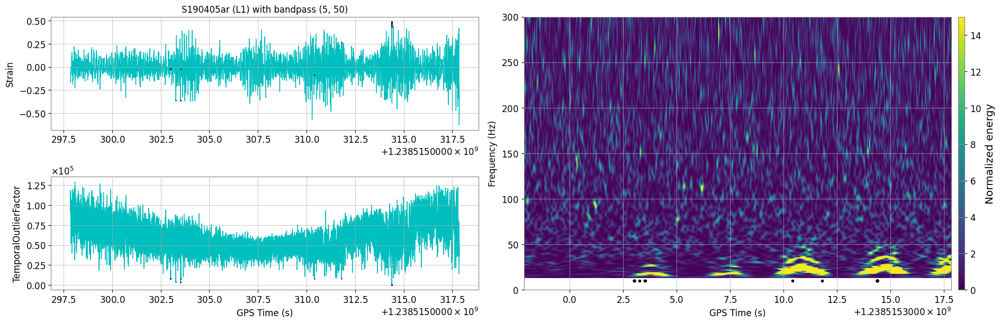

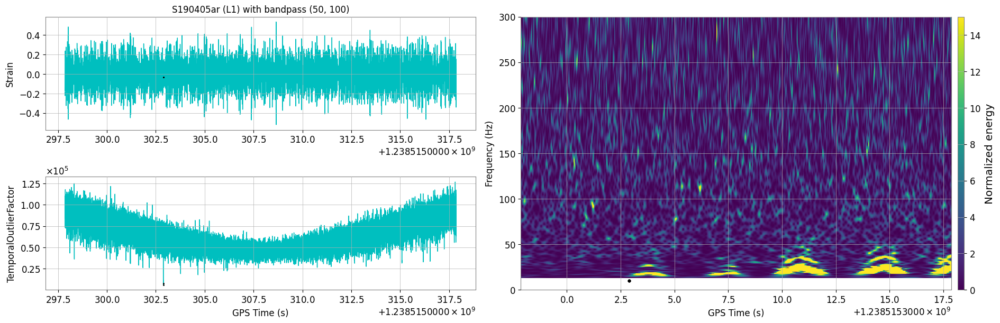

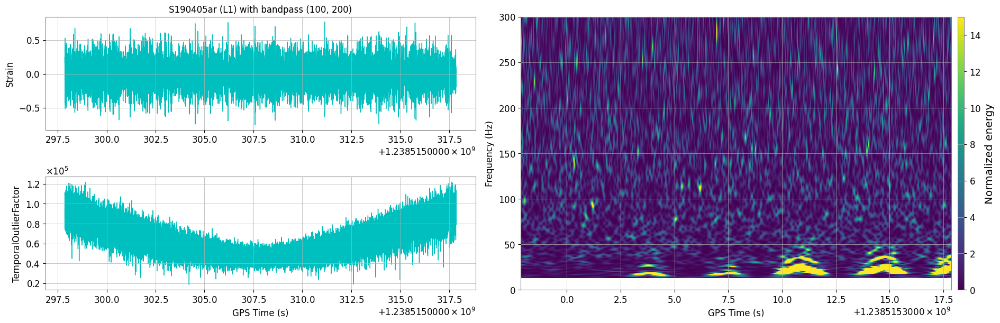

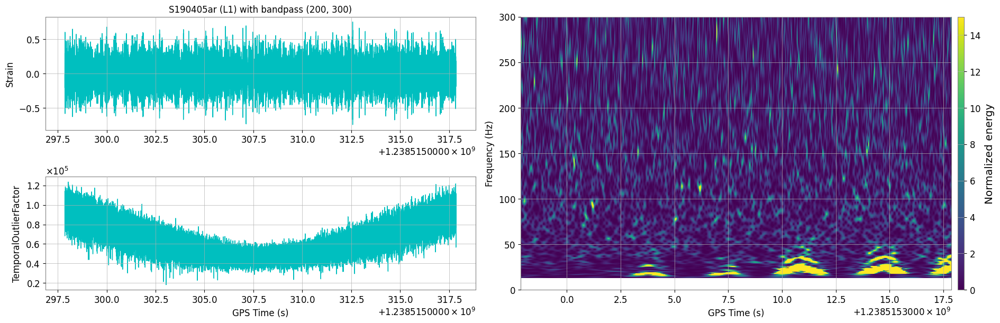

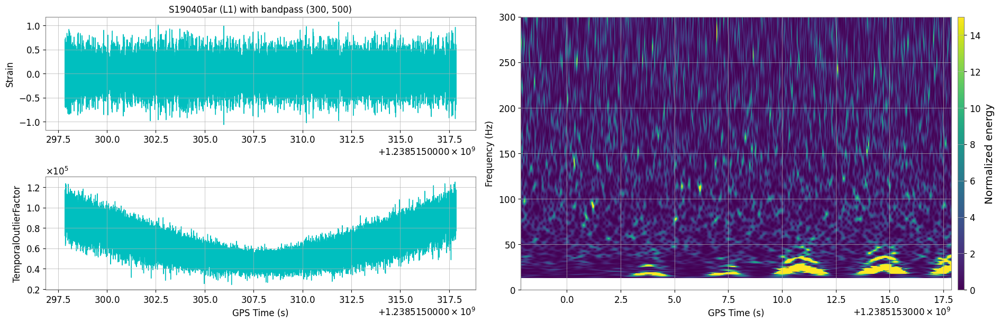

In [22]:
# TOF
for bp, hdata in zip(tqdm(bps), hdatas):
    plot_outlier_comparison(
        hdata, rdata, title=f'S190405ar (L1) with bandpass {bp}',
        tso=TemporalOutlierFactor,
        dims=5, n_neighbors=20, event_length=2**13
    )

  0%|          | 0/5 [00:00<?, ?it/s]

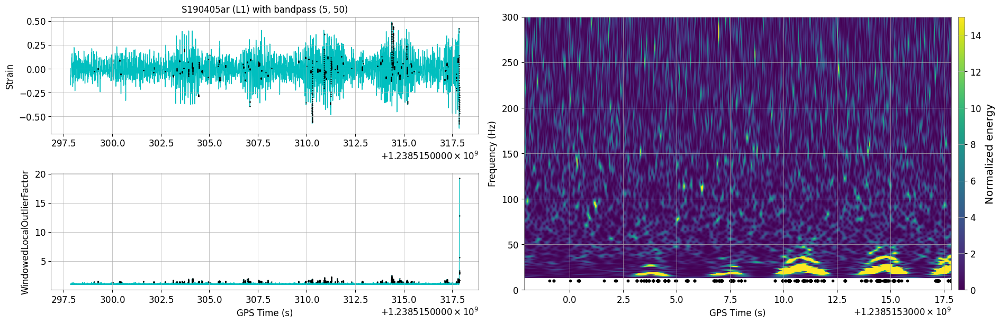

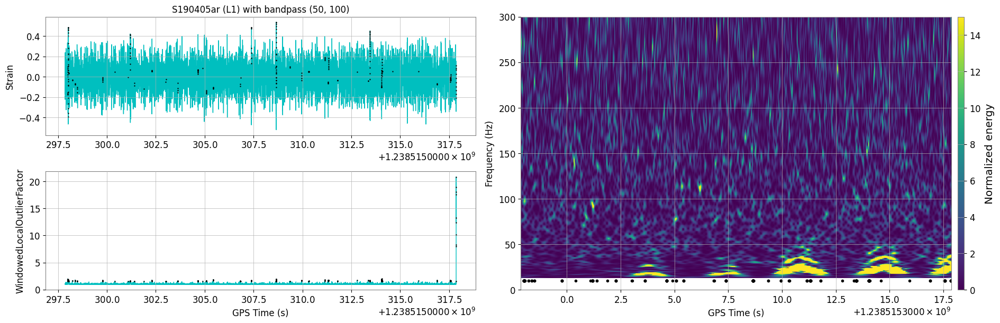

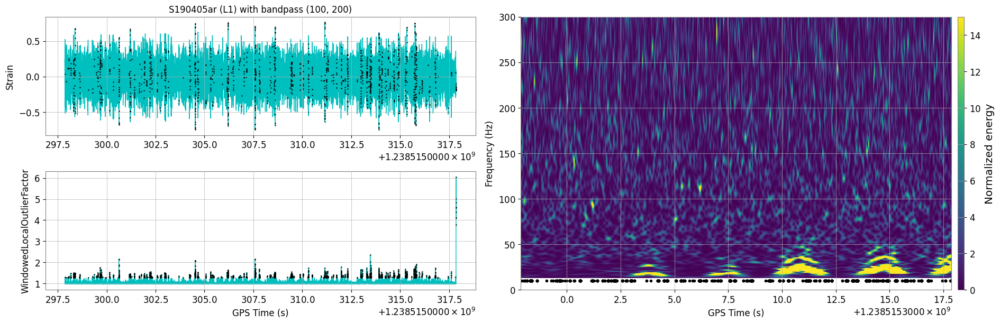

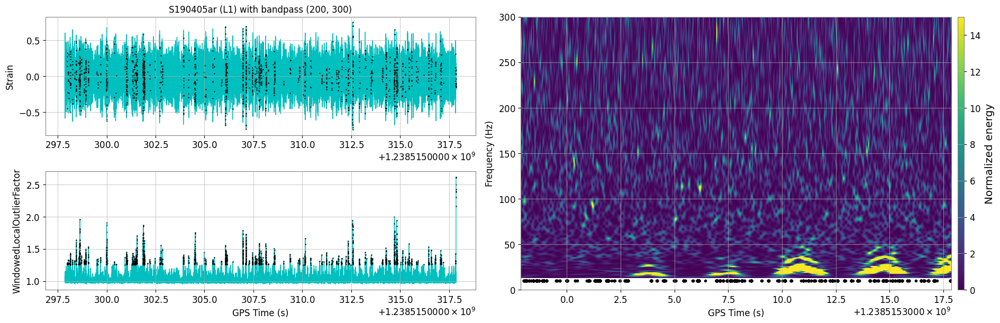

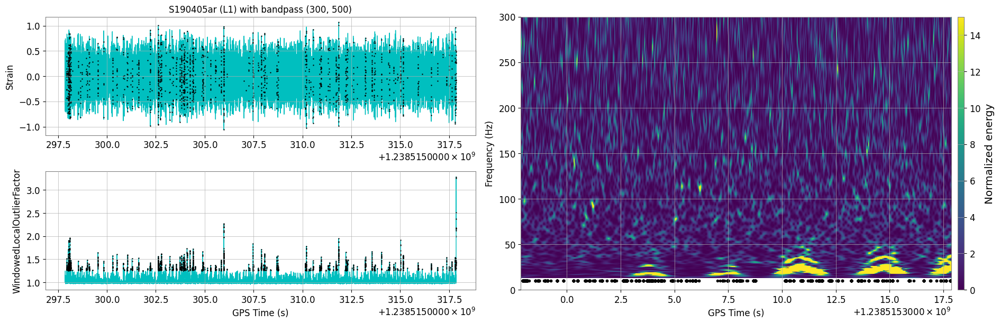

In [21]:
# LOF
for bp, hdata in zip(tqdm(bps), hdatas):
    plot_outlier_comparison(
        hdata, rdata, title=f'S190405ar (L1) with bandpass {bp}',
        tso=WindowedLocalOutlierFactor,
        dims=10, n_neighbors=20, crit_sigma=3
    )